# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [3]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [4]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [5]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [6]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim*8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [7]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [8]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim).to(device)
    #### END CODE HERE ####

In [9]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [10]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [11]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [12]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [13]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Make sure there's no sigmoid
    assert test_input.max() > 1
    assert test_input.min() < -1

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [14]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [15]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [23]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fakes = gen(get_noise(num_images, z_dim, device))
    fakes = fakes.detach()
    fake_preds = disc(fakes)
    f = criterion(fake_preds, torch.zeros_like(fake_preds))
    true_preds = disc(real)
    t = criterion(true_preds, torch.ones_like(true_preds))
    disc_loss = (f+t)/2
    #### END CODE HERE ####
    return disc_loss

In [24]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [27]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fakes = gen(get_noise(num_images, z_dim, device))
    preds = disc(fakes)
    gen_loss = criterion(preds, torch.ones_like(preds))
    #### END CODE HERE ####
    return gen_loss

In [28]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Step 500: Generator loss: 1.4505001808404925, discriminator loss: 0.40885847890377036


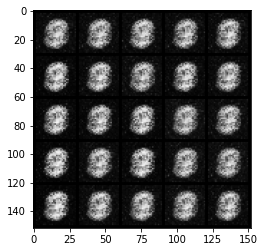

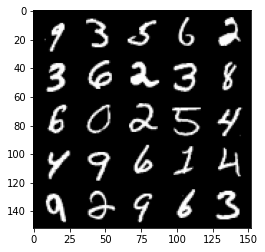

Step 1000: Generator loss: 1.795198075056078, discriminator loss: 0.2690865359008313


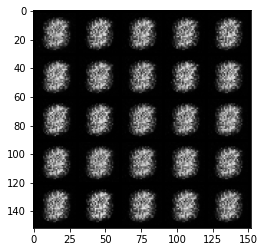

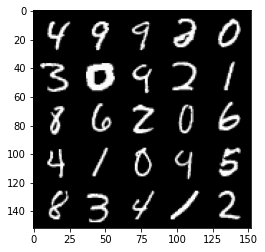

Step 1500: Generator loss: 2.04235531783104, discriminator loss: 0.1638143839538098


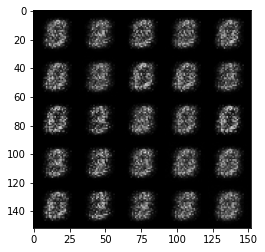

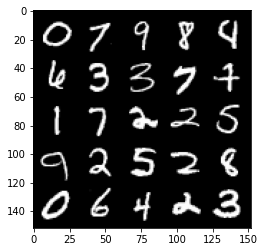

Step 2000: Generator loss: 1.6626037068367003, discriminator loss: 0.23185131016373622


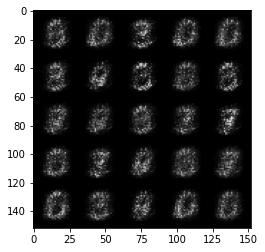

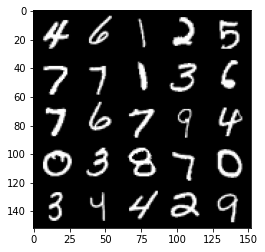

Step 2500: Generator loss: 1.5539499676227568, discriminator loss: 0.23795142117142679


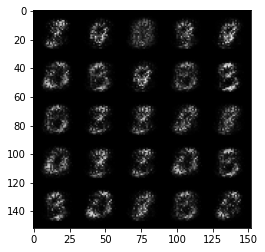

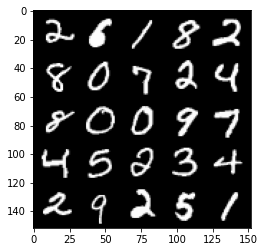

Step 3000: Generator loss: 1.8153836269378658, discriminator loss: 0.18758564218878737


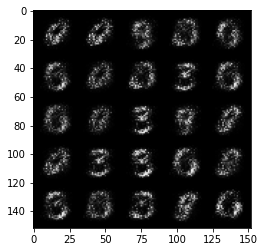

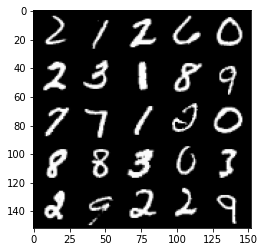

Step 3500: Generator loss: 2.3076773264408077, discriminator loss: 0.1352583220005036


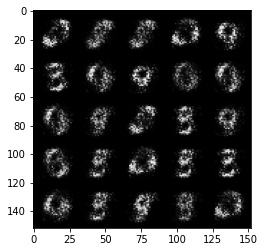

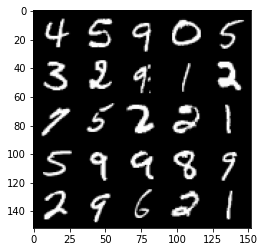

Step 4000: Generator loss: 2.6919870648384117, discriminator loss: 0.11213244698941707


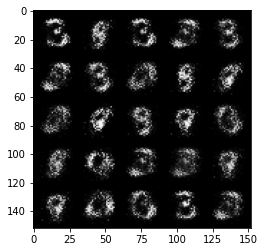

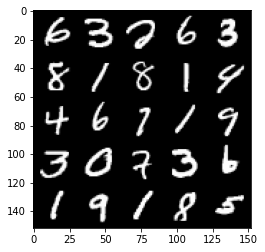

Step 4500: Generator loss: 3.0222085337638838, discriminator loss: 0.10513974207639694


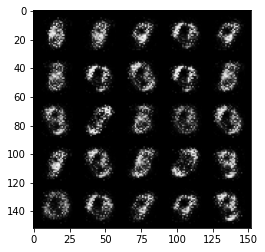

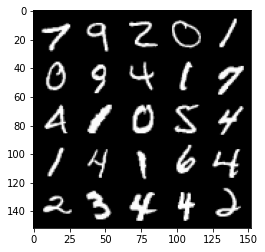

Step 5000: Generator loss: 3.3876639027595483, discriminator loss: 0.09811329536139973


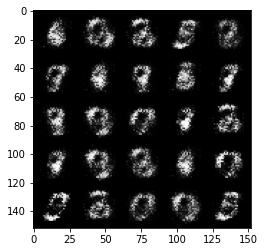

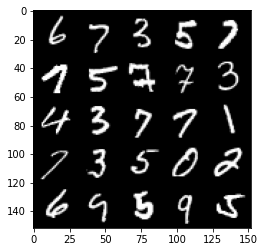

Step 5500: Generator loss: 3.389907530307766, discriminator loss: 0.08469262937456369


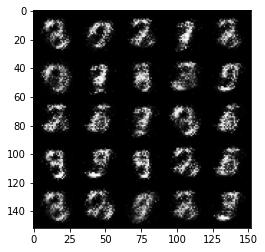

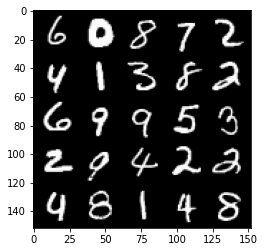

Step 6000: Generator loss: 3.6569795317649847, discriminator loss: 0.07292329888790845


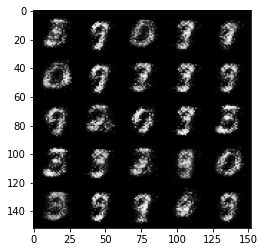

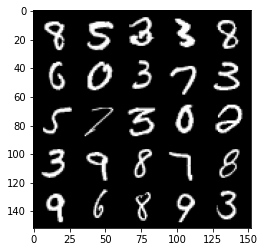

Step 6500: Generator loss: 3.758316353797916, discriminator loss: 0.07052572632580999


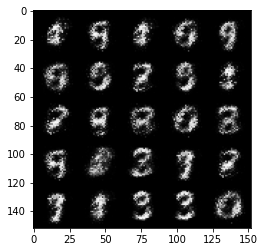

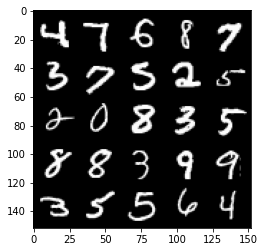

Step 7000: Generator loss: 3.6654346346855173, discriminator loss: 0.06985959754139189


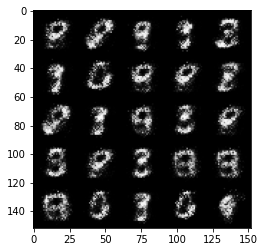

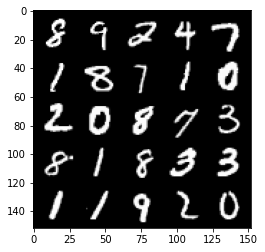

Step 7500: Generator loss: 3.7401650896072383, discriminator loss: 0.06285114437341689


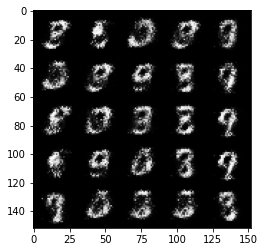

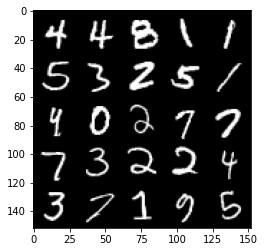

Step 8000: Generator loss: 3.7261084127426116, discriminator loss: 0.06398198803514242


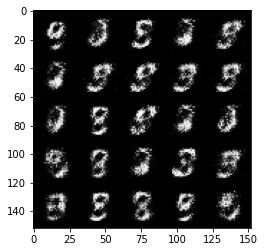

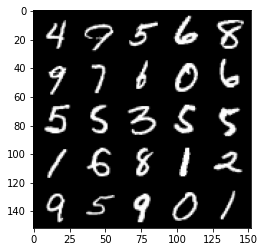

Step 8500: Generator loss: 3.952292220592499, discriminator loss: 0.059206643298268316


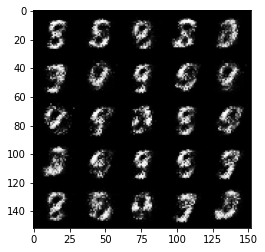

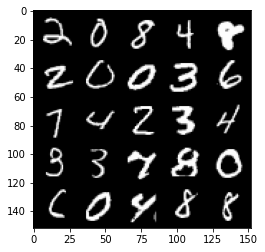

Step 9000: Generator loss: 4.122624618053438, discriminator loss: 0.05603563980385661


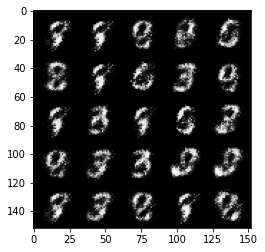

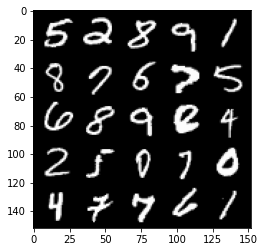

Step 9500: Generator loss: 4.145287539958956, discriminator loss: 0.056938286013901294


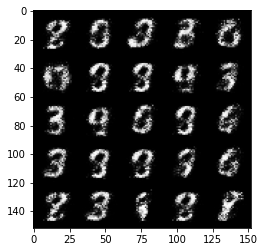

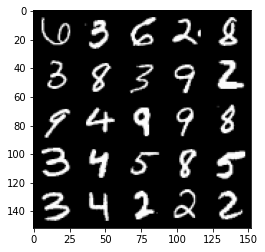

Step 10000: Generator loss: 4.021984615802765, discriminator loss: 0.061316753905266516


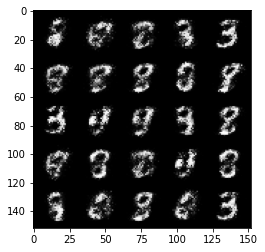

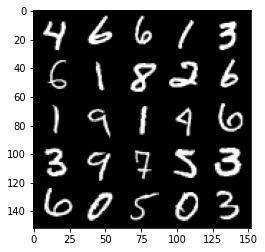

Step 10500: Generator loss: 3.8765998106002777, discriminator loss: 0.0701237195581198


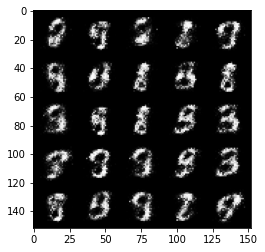

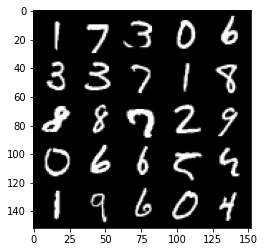

Step 11000: Generator loss: 4.236439924240108, discriminator loss: 0.06602389363571999


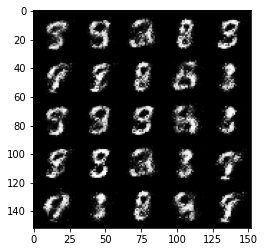

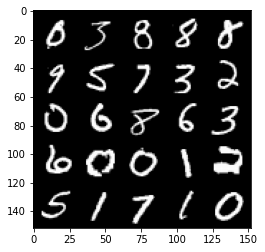

Step 11500: Generator loss: 4.000678685188292, discriminator loss: 0.07088050004839905


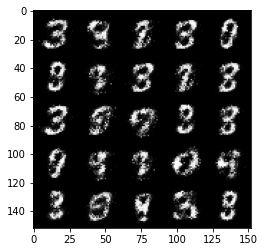

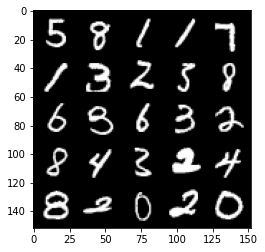

Step 12000: Generator loss: 3.9820370688438396, discriminator loss: 0.07285176846385001


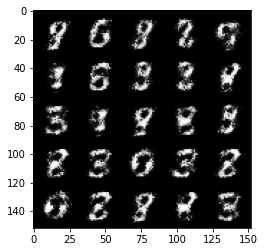

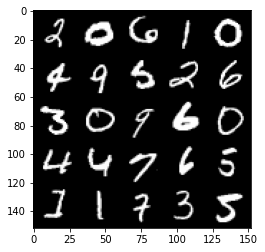

Step 12500: Generator loss: 3.989554237365722, discriminator loss: 0.07878910183161494


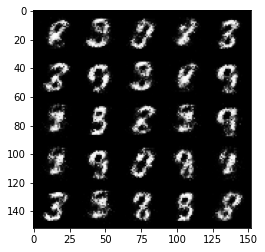

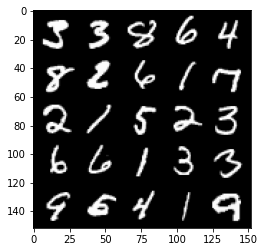

Step 13000: Generator loss: 3.7146068043708804, discriminator loss: 0.08209064528346063


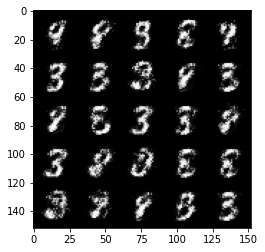

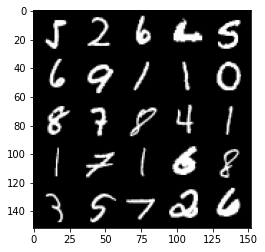

Step 13500: Generator loss: 3.917677175998685, discriminator loss: 0.07910352608934038


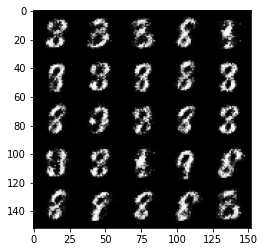

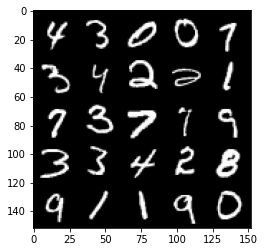

Step 14000: Generator loss: 3.708592906951905, discriminator loss: 0.09212617445737128


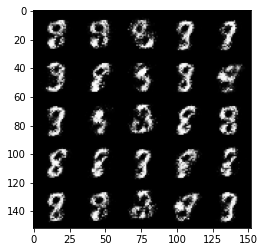

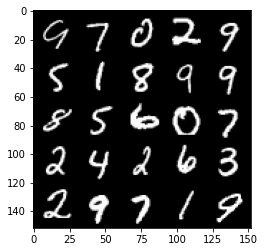

Step 14500: Generator loss: 3.706223289012911, discriminator loss: 0.0944644597843289


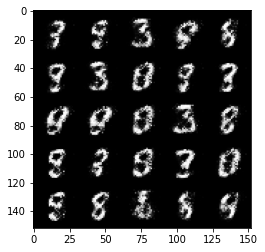

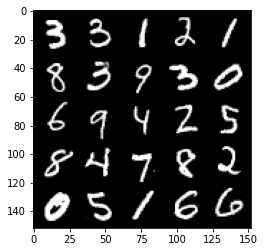

Step 15000: Generator loss: 3.6340973019599905, discriminator loss: 0.10199699697643524


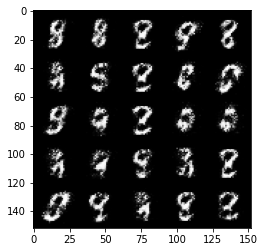

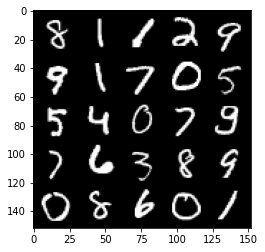

Step 15500: Generator loss: 3.7036341013908385, discriminator loss: 0.10576137562841183


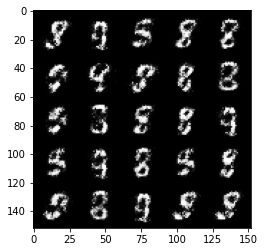

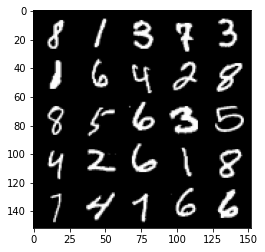

Step 16000: Generator loss: 3.8554962196350133, discriminator loss: 0.09632896924018866


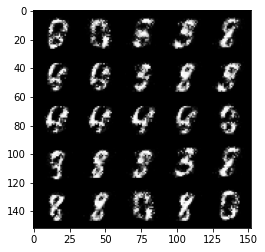

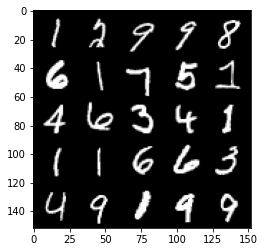

Step 16500: Generator loss: 3.7339881291389494, discriminator loss: 0.11369501044601193


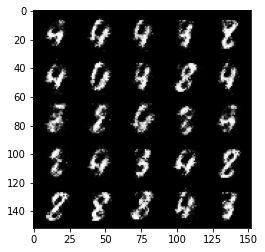

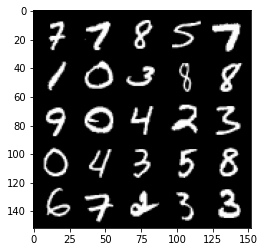

Step 17000: Generator loss: 3.8700214581489565, discriminator loss: 0.10723572742938998


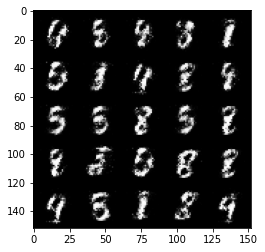

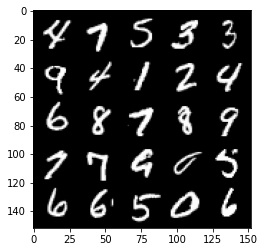

Step 17500: Generator loss: 3.8188363132476804, discriminator loss: 0.1096829123273492


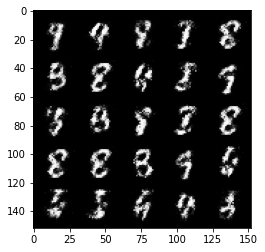

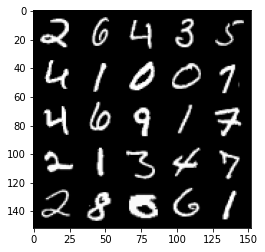

Step 18000: Generator loss: 3.604268417835235, discriminator loss: 0.12615555161237718


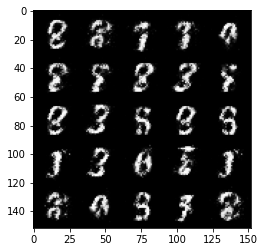

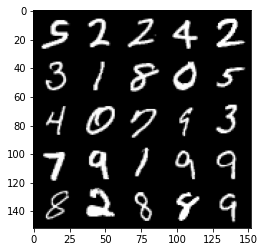

Step 18500: Generator loss: 3.6009105625152604, discriminator loss: 0.12212223394215105


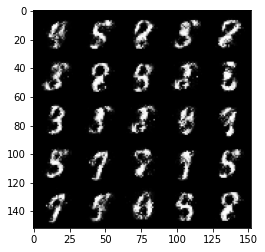

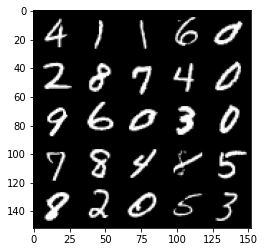

Step 19000: Generator loss: 3.402036122322081, discriminator loss: 0.12846089050173765


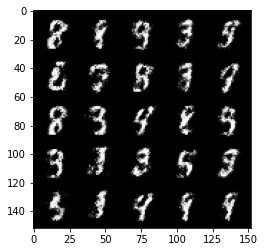

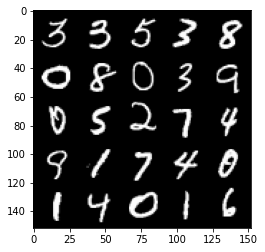

Step 19500: Generator loss: 3.2967835330963164, discriminator loss: 0.15297560340166083


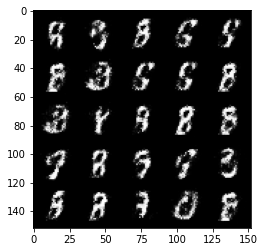

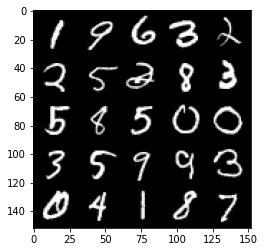

Step 20000: Generator loss: 3.3085163435935985, discriminator loss: 0.16692711025476437


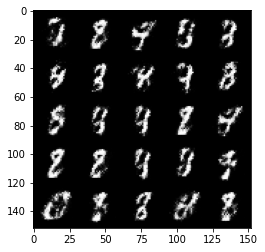

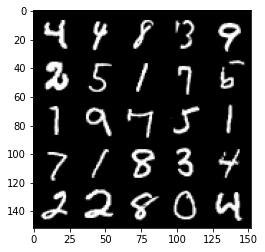

Step 20500: Generator loss: 3.0659866461753835, discriminator loss: 0.16618308204412457


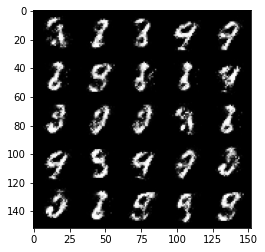

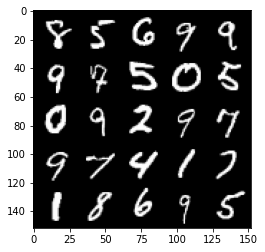

Step 21000: Generator loss: 3.233897431850434, discriminator loss: 0.14995871303975586


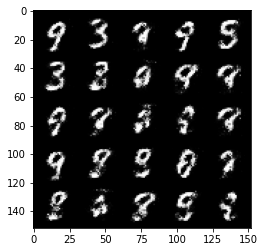

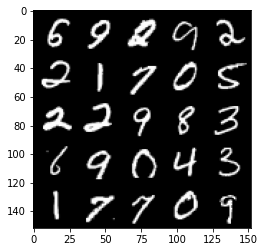

Step 21500: Generator loss: 3.2213570647239678, discriminator loss: 0.1539978372007608


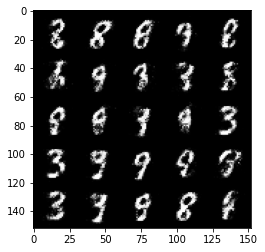

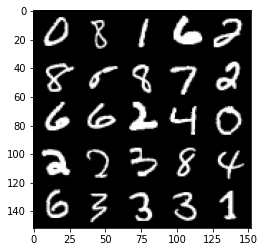

Step 22000: Generator loss: 3.1472835006713855, discriminator loss: 0.17355438323318975


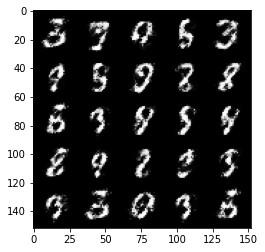

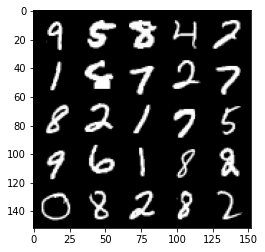

Step 22500: Generator loss: 3.1189543232917756, discriminator loss: 0.15523869343101984


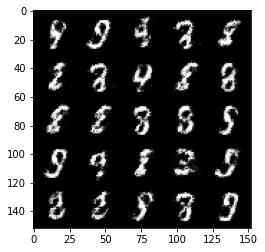

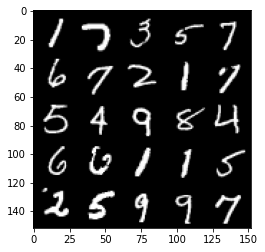

Step 23000: Generator loss: 3.148095519065855, discriminator loss: 0.16862365475296986


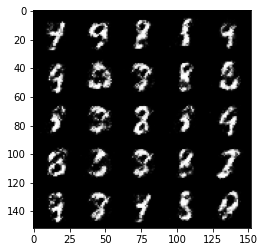

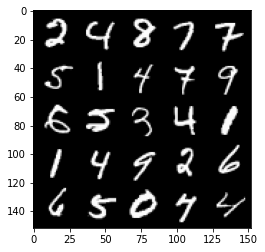

Step 23500: Generator loss: 2.97682619524002, discriminator loss: 0.18929702703654738


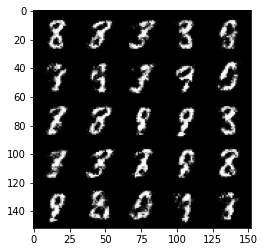

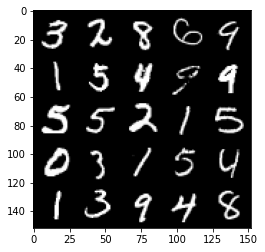

Step 24000: Generator loss: 2.9898958811759915, discriminator loss: 0.1965022969096899


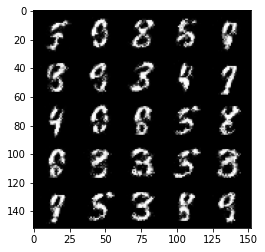

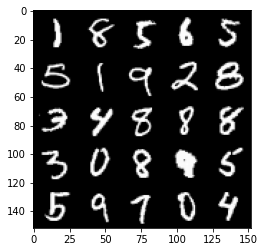

Step 24500: Generator loss: 2.8527688260078436, discriminator loss: 0.2036201543062925


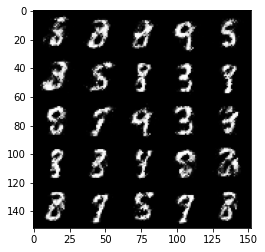

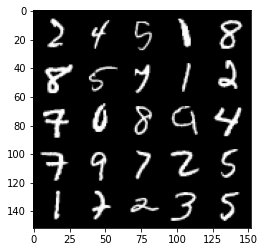

Step 25000: Generator loss: 2.948360313892364, discriminator loss: 0.18040212044119794


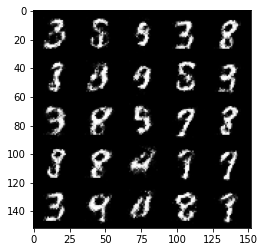

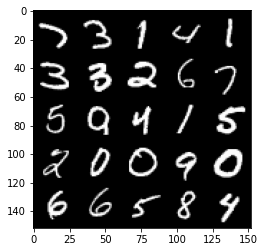

Step 25500: Generator loss: 3.023887357234956, discriminator loss: 0.1882704465091227


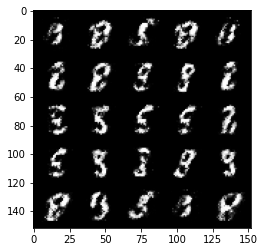

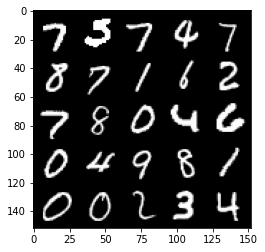

Step 26000: Generator loss: 2.894470498561861, discriminator loss: 0.18762290990352615


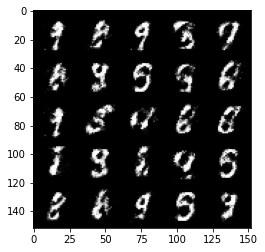

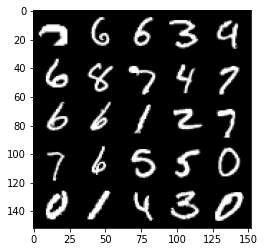

Step 26500: Generator loss: 2.849227823734285, discriminator loss: 0.2116258752942085


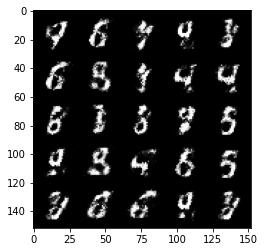

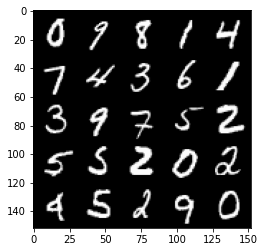

Step 27000: Generator loss: 2.8592377762794463, discriminator loss: 0.20300085987150684


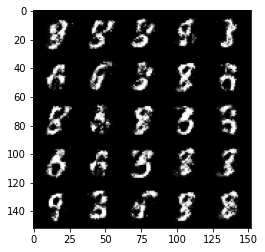

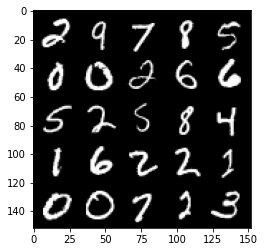

Step 27500: Generator loss: 2.8847204823493935, discriminator loss: 0.20052913086116303


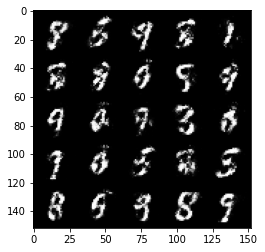

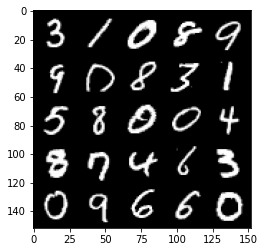

Step 28000: Generator loss: 2.7803207712173474, discriminator loss: 0.21962055051326745


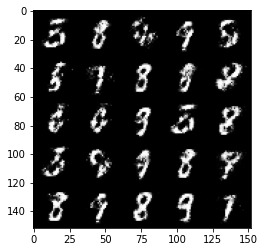

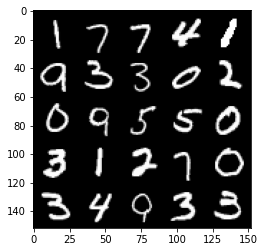

Step 28500: Generator loss: 2.670327770709991, discriminator loss: 0.22414322565495995


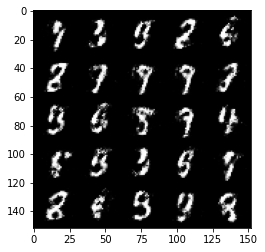

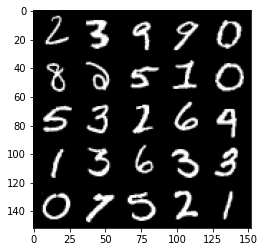

Step 29000: Generator loss: 2.5266453652381897, discriminator loss: 0.26083893024921434


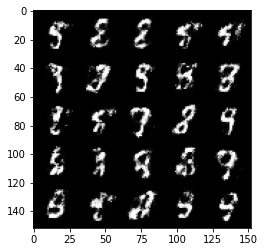

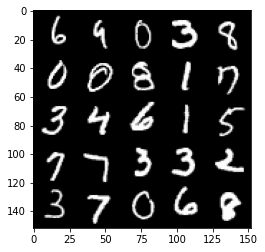

Step 29500: Generator loss: 2.521319391250609, discriminator loss: 0.25582388764619823


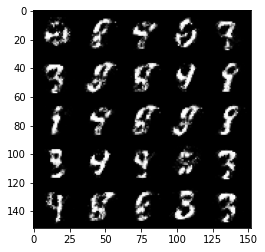

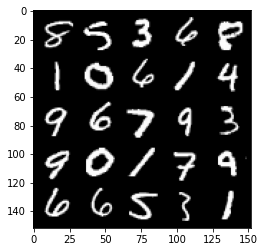

Step 30000: Generator loss: 2.496040019750596, discriminator loss: 0.24837603265047062


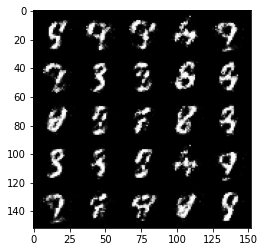

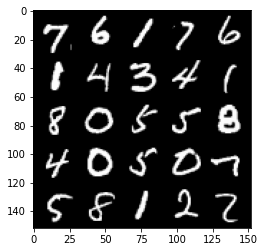

Step 30500: Generator loss: 2.575479066848755, discriminator loss: 0.23778650134801874


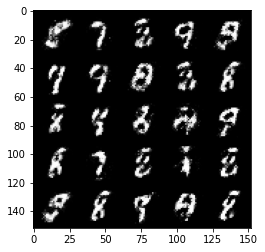

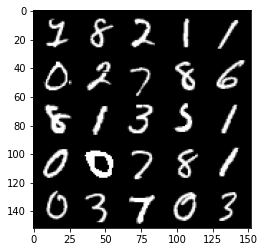

Step 31000: Generator loss: 2.6306972556114205, discriminator loss: 0.22308277723193154


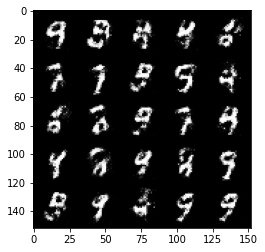

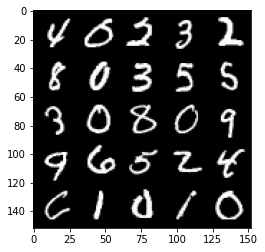

Step 31500: Generator loss: 2.613291887760161, discriminator loss: 0.2296652222871778


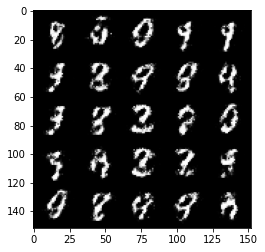

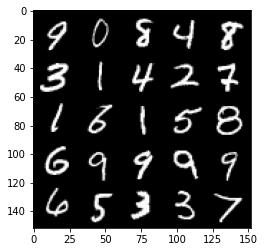

Step 32000: Generator loss: 2.634145780086519, discriminator loss: 0.221599151700735


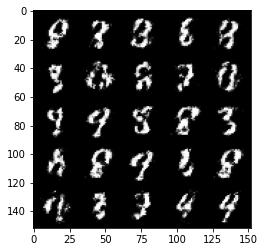

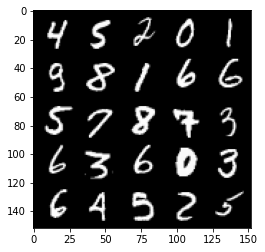

Step 32500: Generator loss: 2.6823473839759813, discriminator loss: 0.2322371402680875


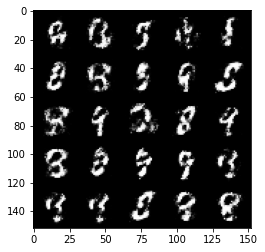

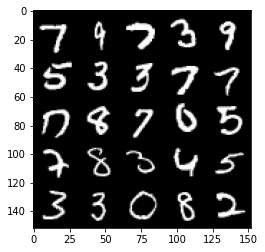

Step 33000: Generator loss: 2.5148739788532253, discriminator loss: 0.244707390576601


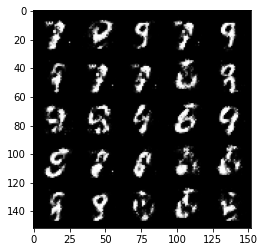

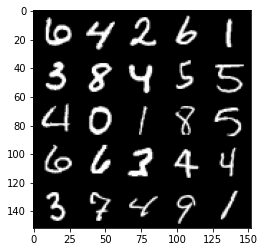

Step 33500: Generator loss: 2.455660386800766, discriminator loss: 0.24437604221701612


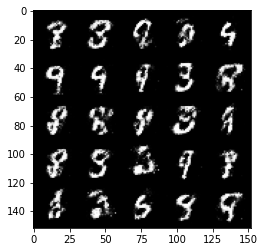

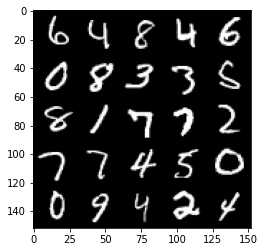

Step 34000: Generator loss: 2.448840113878248, discriminator loss: 0.2583527817428112


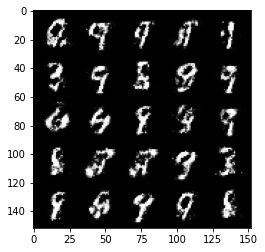

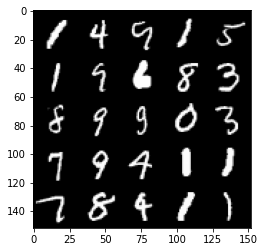

Step 34500: Generator loss: 2.427443995952605, discriminator loss: 0.254361776024103


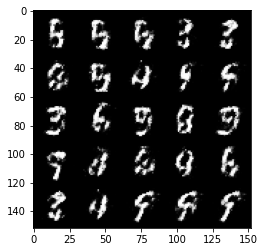

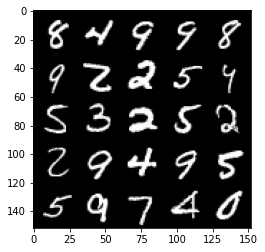

Step 35000: Generator loss: 2.3981011452674865, discriminator loss: 0.27647150754928596


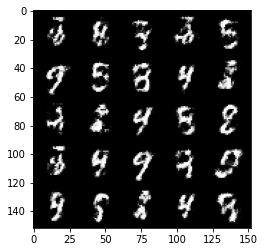

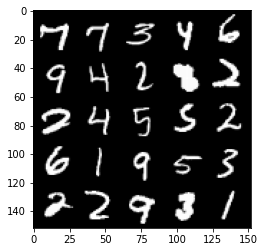

Step 35500: Generator loss: 2.3926372709274295, discriminator loss: 0.26647015932202334


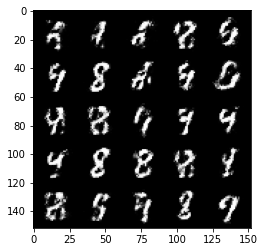

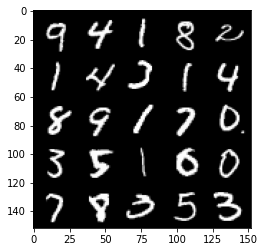

Step 36000: Generator loss: 2.5120416991710655, discriminator loss: 0.2559277348220348


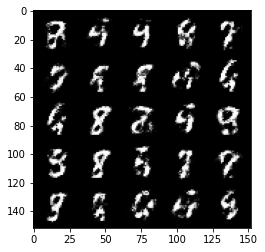

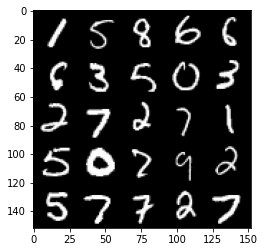

Step 36500: Generator loss: 2.4039698021411895, discriminator loss: 0.2774381391406063


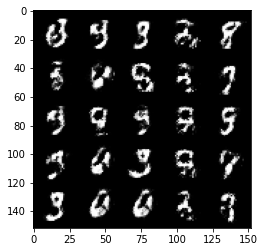

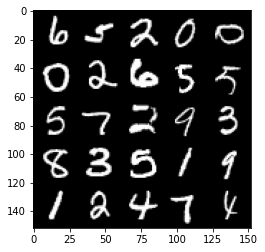

Step 37000: Generator loss: 2.3273337068557707, discriminator loss: 0.2830749807357787


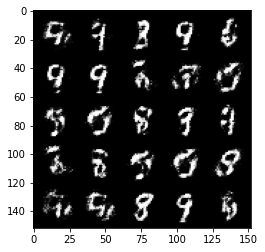

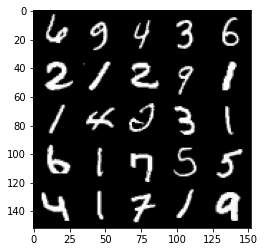

Step 37500: Generator loss: 2.2667208373546597, discriminator loss: 0.2881693195402624


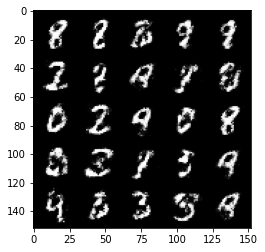

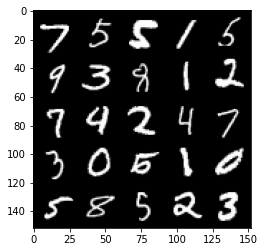

Step 38000: Generator loss: 2.2352115836143485, discriminator loss: 0.29225939667224893


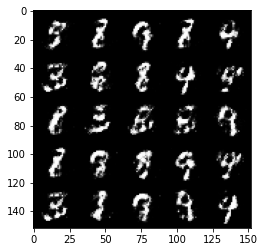

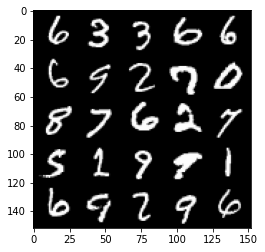

Step 38500: Generator loss: 2.218395311832429, discriminator loss: 0.29639611533284205


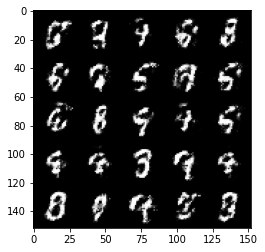

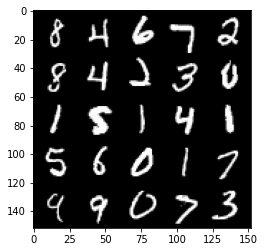

Step 39000: Generator loss: 2.2675084323883072, discriminator loss: 0.2888078340888023


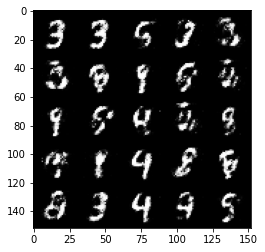

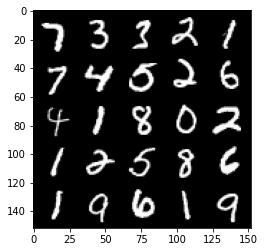

Step 39500: Generator loss: 2.2557970499992384, discriminator loss: 0.2853496622443196


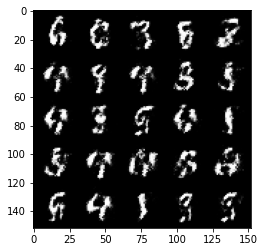

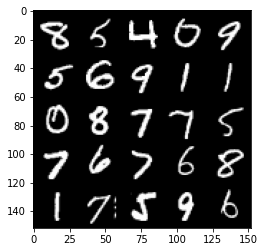

Step 40000: Generator loss: 2.2167421779632592, discriminator loss: 0.30861972606182103


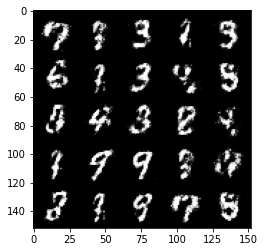

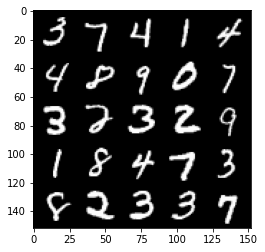

Step 40500: Generator loss: 2.121608099222182, discriminator loss: 0.31477276226878187


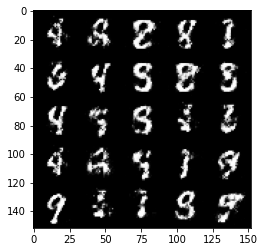

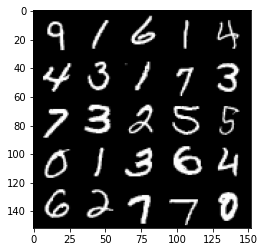

Step 41000: Generator loss: 2.081196771383286, discriminator loss: 0.3083465115427974


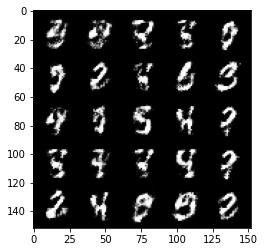

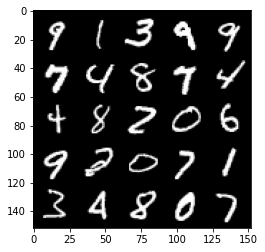

Step 41500: Generator loss: 2.2539359557628647, discriminator loss: 0.26920317396521587


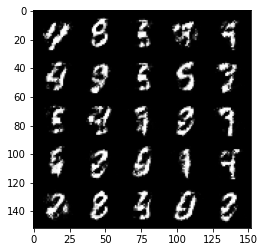

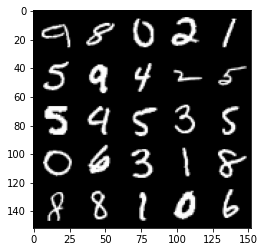

Step 42000: Generator loss: 2.2628629946708667, discriminator loss: 0.27895237979292886


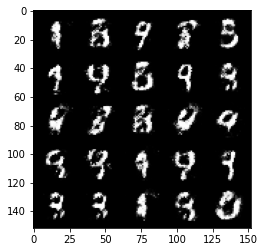

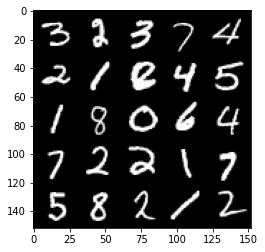

Step 42500: Generator loss: 2.2495268297195414, discriminator loss: 0.2863478620350362


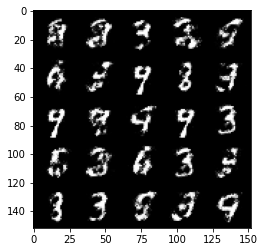

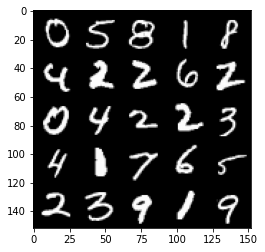

Step 43000: Generator loss: 2.128396565675734, discriminator loss: 0.3009074874818326


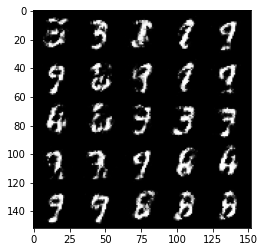

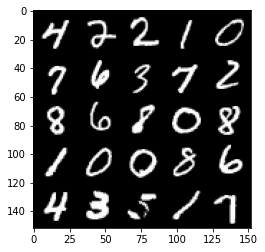

Step 43500: Generator loss: 2.103531304836273, discriminator loss: 0.3086930988132954


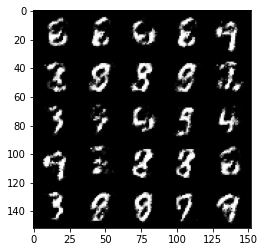

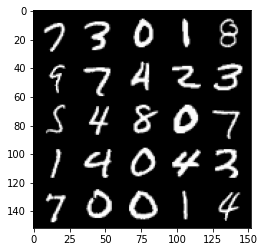

Step 44000: Generator loss: 2.073953781366346, discriminator loss: 0.30321266999840735


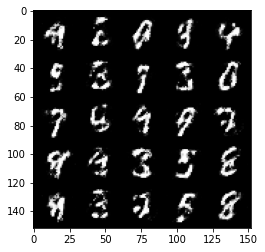

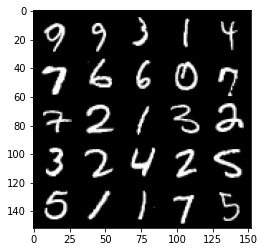

Step 44500: Generator loss: 2.094317584991455, discriminator loss: 0.3002040493488309


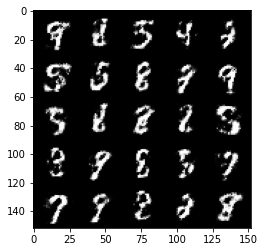

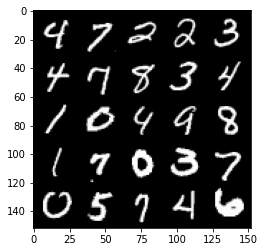

Step 45000: Generator loss: 1.9446320970058446, discriminator loss: 0.34103555336594615


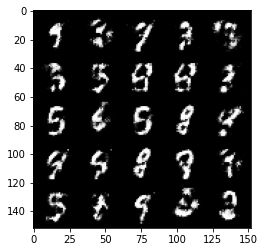

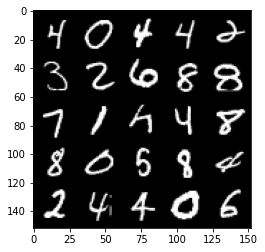

Step 45500: Generator loss: 1.9530917322635633, discriminator loss: 0.3228825458288191


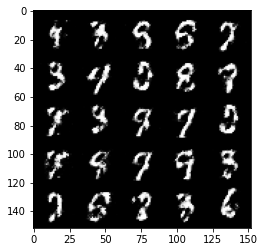

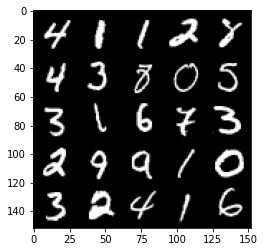

Step 46000: Generator loss: 2.0891434864997858, discriminator loss: 0.30677284651994724


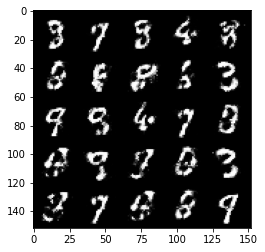

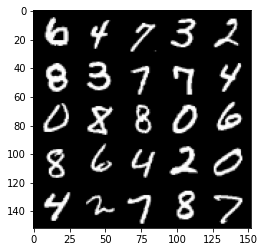

Step 46500: Generator loss: 2.0470779547691333, discriminator loss: 0.3099669980406763


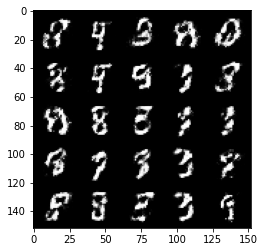

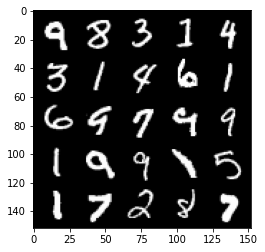

Step 47000: Generator loss: 1.9713131308555594, discriminator loss: 0.33289966416358935


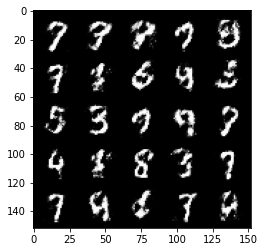

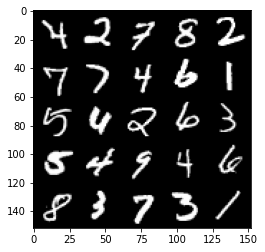

Step 47500: Generator loss: 2.043377060890197, discriminator loss: 0.3128418643772602


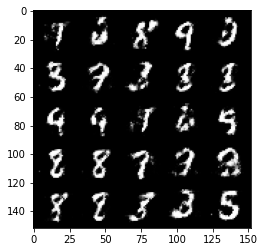

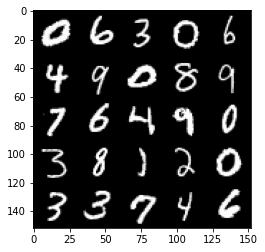

Step 48000: Generator loss: 1.9480730805397015, discriminator loss: 0.33809374493360517


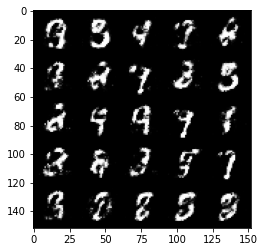

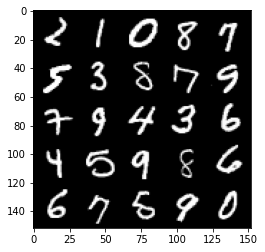

Step 48500: Generator loss: 1.9575597324371352, discriminator loss: 0.3259452818334103


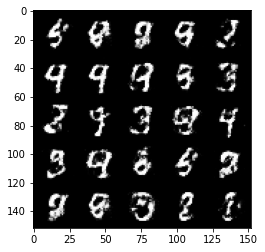

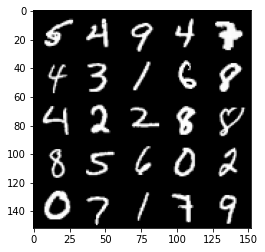

Step 49000: Generator loss: 1.920688534498215, discriminator loss: 0.35351355186104794


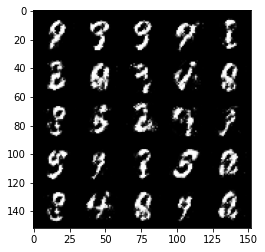

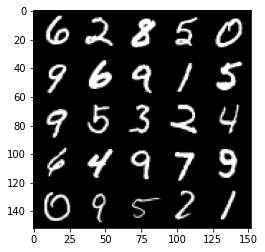

Step 49500: Generator loss: 1.907484135627746, discriminator loss: 0.34938655176758765


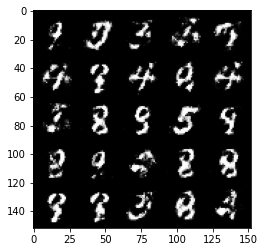

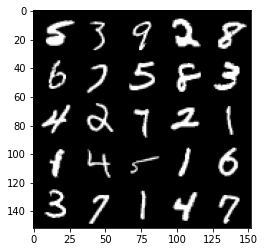

Step 50000: Generator loss: 1.8573306505680085, discriminator loss: 0.36566583561897287


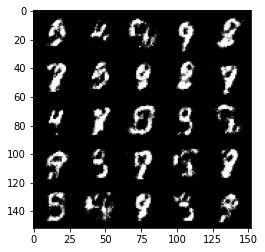

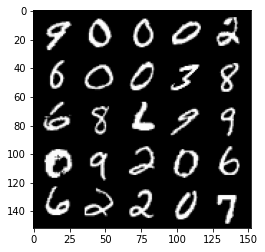

Step 50500: Generator loss: 1.8855779175758385, discriminator loss: 0.3469685973823073


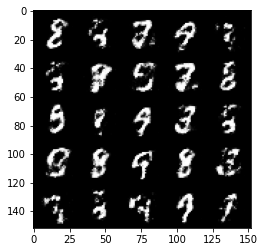

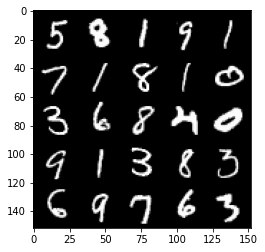

Step 51000: Generator loss: 2.0047573242187493, discriminator loss: 0.3166121538877484


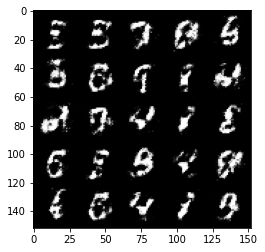

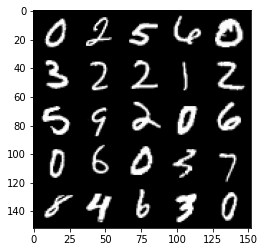

Step 51500: Generator loss: 2.037459862709046, discriminator loss: 0.3319192943572998


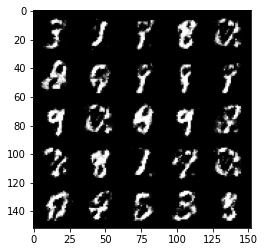

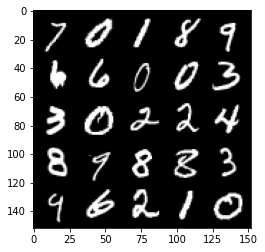

Step 52000: Generator loss: 1.9118444216251385, discriminator loss: 0.3508806024789812


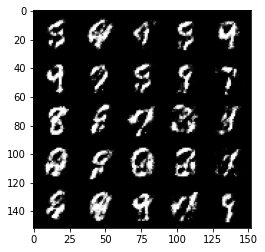

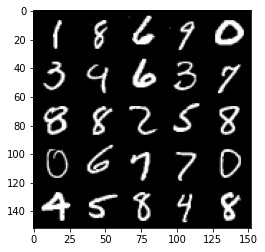

Step 52500: Generator loss: 1.8835231277942666, discriminator loss: 0.3499457756578924


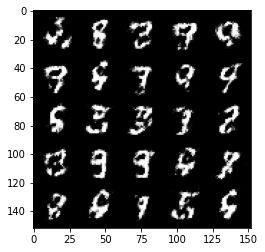

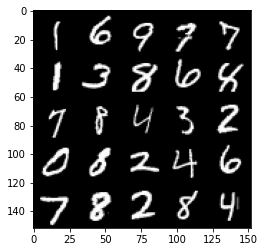

Step 53000: Generator loss: 1.9555874350070945, discriminator loss: 0.33676426872611054


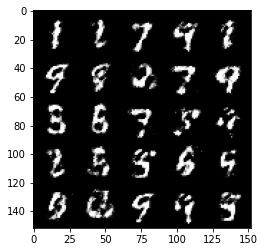

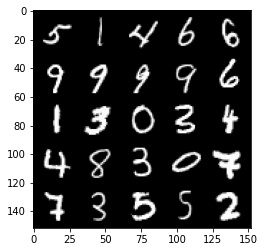

Step 53500: Generator loss: 1.8794698271751407, discriminator loss: 0.3515353274345397


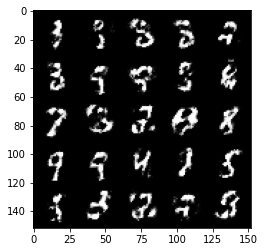

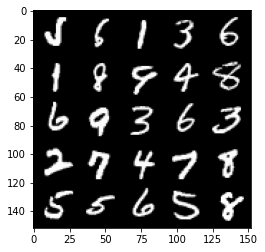

Step 54000: Generator loss: 1.8349051637649556, discriminator loss: 0.3555978823900224


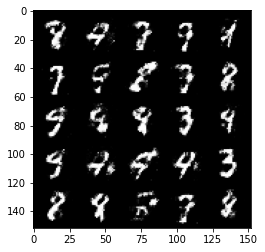

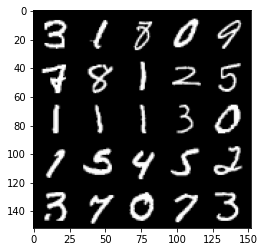

Step 54500: Generator loss: 1.7680946915149696, discriminator loss: 0.38015234792232516


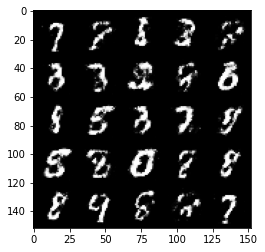

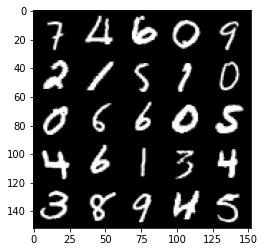

Step 55000: Generator loss: 1.8169583373069753, discriminator loss: 0.3444406676590443


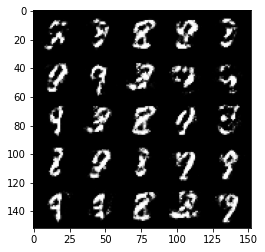

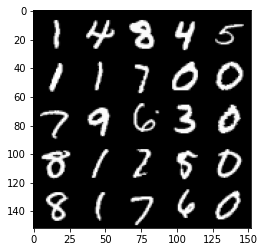

Step 55500: Generator loss: 1.7731450510025026, discriminator loss: 0.37399503153562547


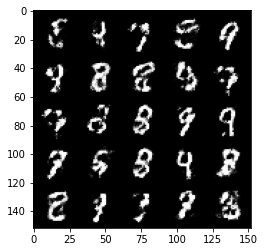

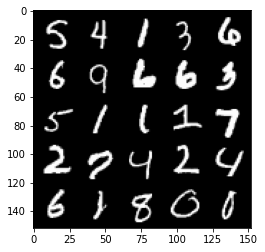

Step 56000: Generator loss: 1.8403413941860196, discriminator loss: 0.36134764486551274


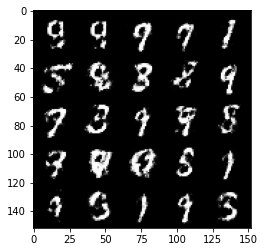

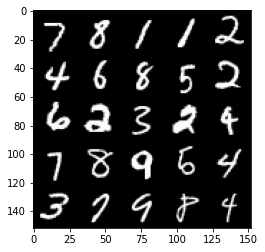

Step 56500: Generator loss: 1.7115349521636953, discriminator loss: 0.3843592768907547


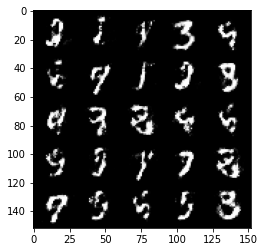

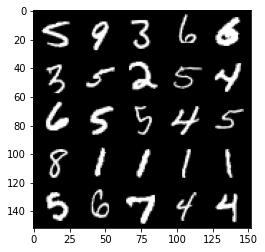

Step 57000: Generator loss: 1.790937647104262, discriminator loss: 0.3552562454342842


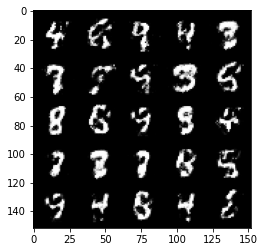

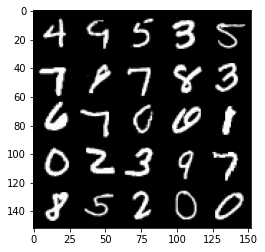

Step 57500: Generator loss: 1.8422235126495359, discriminator loss: 0.34797245150804496


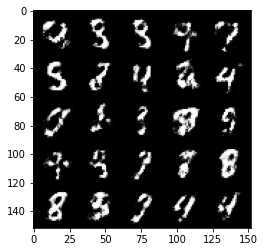

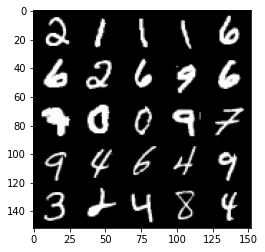

Step 58000: Generator loss: 1.7739700727462748, discriminator loss: 0.3637734358310697


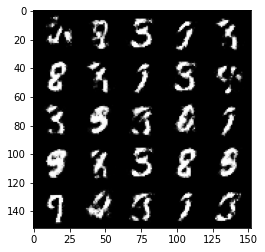

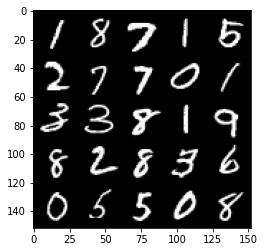

Step 58500: Generator loss: 1.670021936178208, discriminator loss: 0.38993768984079386


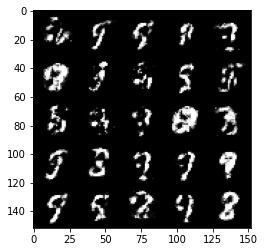

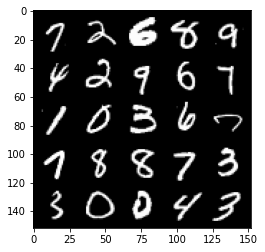

Step 59000: Generator loss: 1.6836113457679733, discriminator loss: 0.38288455671072025


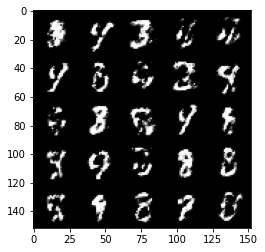

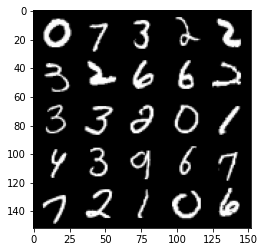

Step 59500: Generator loss: 1.8249779059886932, discriminator loss: 0.34630575826764054


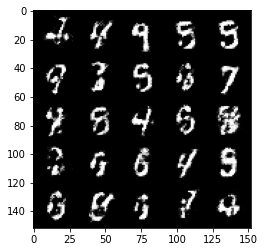

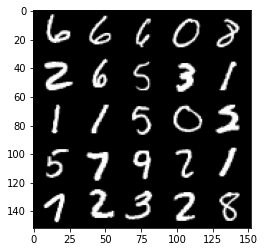

Step 60000: Generator loss: 1.8620214684009557, discriminator loss: 0.35877086013555537


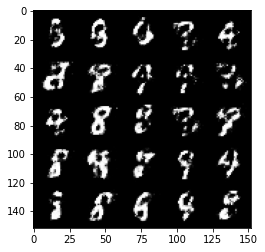

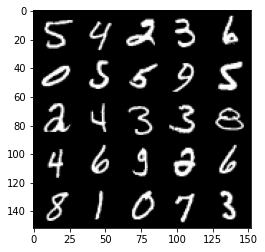

Step 60500: Generator loss: 1.7284294426441196, discriminator loss: 0.3717486529946332


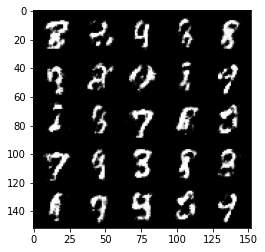

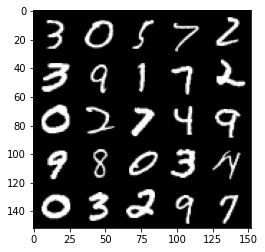

Step 61000: Generator loss: 1.7592865064144132, discriminator loss: 0.36349485123157527


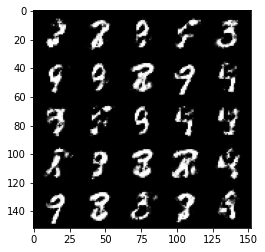

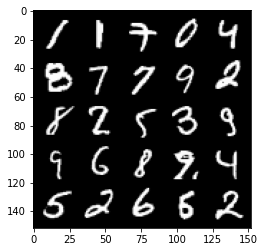

Step 61500: Generator loss: 1.7341514139175416, discriminator loss: 0.3817208573222159


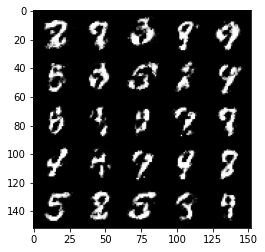

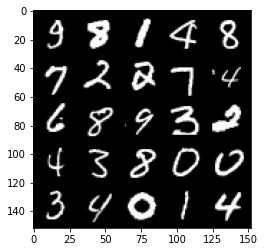

Step 62000: Generator loss: 1.7052058868408215, discriminator loss: 0.4034546430110933


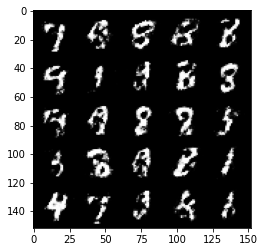

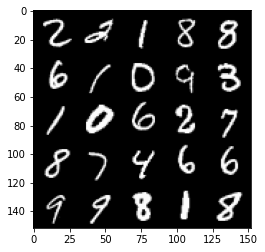

Step 62500: Generator loss: 1.6609888901710506, discriminator loss: 0.3836097575426102


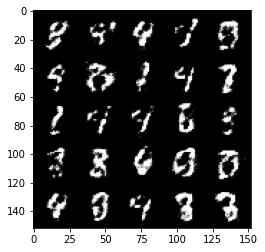

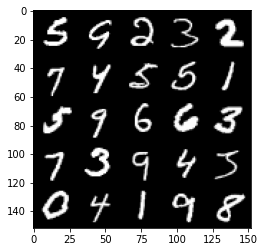

Step 63000: Generator loss: 1.663308384180069, discriminator loss: 0.3891933478116987


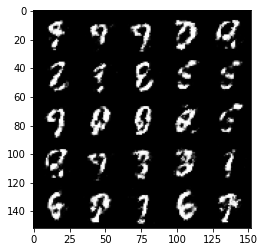

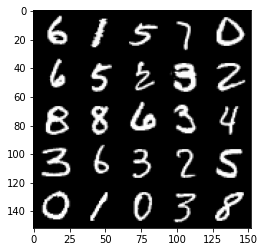

Step 63500: Generator loss: 1.6754170467853544, discriminator loss: 0.38913919275999104


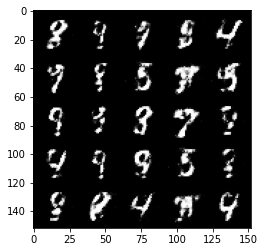

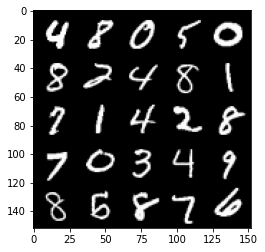

Step 64000: Generator loss: 1.6695963594913488, discriminator loss: 0.3806142347455026


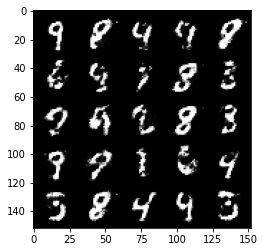

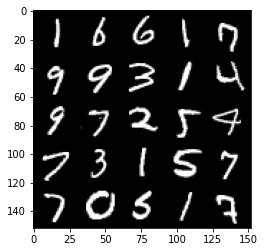

Step 64500: Generator loss: 1.720466517925261, discriminator loss: 0.3678744336366658


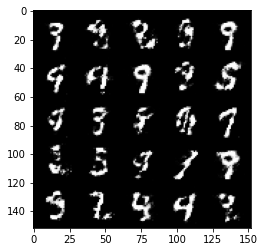

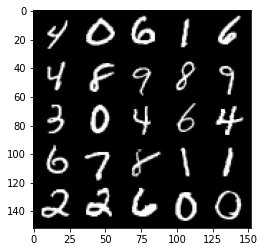

Step 65000: Generator loss: 1.5984119167327877, discriminator loss: 0.40548213905096014


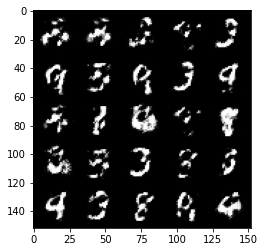

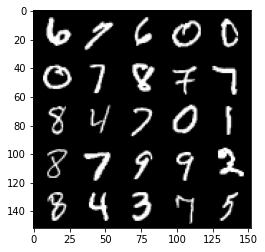

Step 65500: Generator loss: 1.5912210748195648, discriminator loss: 0.39697454285621636


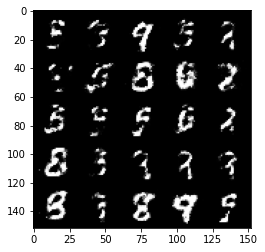

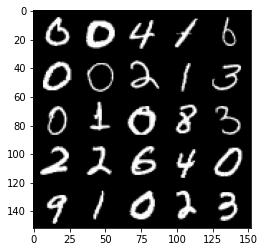

Step 66000: Generator loss: 1.604236760377886, discriminator loss: 0.39315637844800955


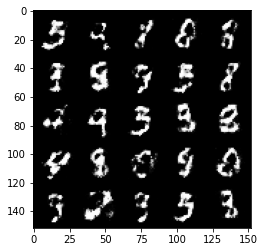

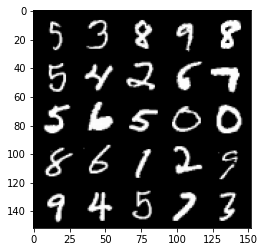

Step 66500: Generator loss: 1.5895249543189989, discriminator loss: 0.4066121017932889


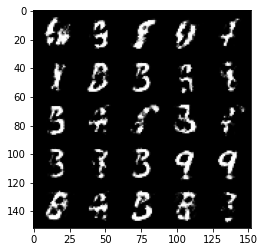

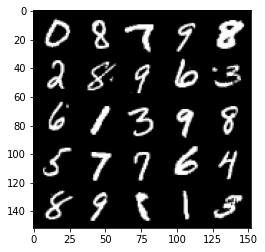

Step 67000: Generator loss: 1.5586326911449437, discriminator loss: 0.413609384715557


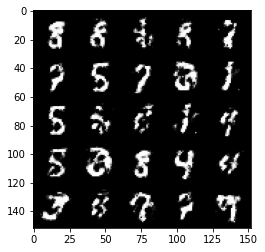

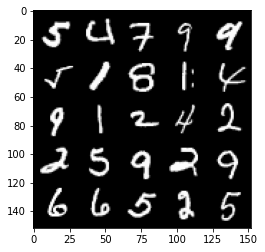

Step 67500: Generator loss: 1.5648284208774568, discriminator loss: 0.4086711944937709


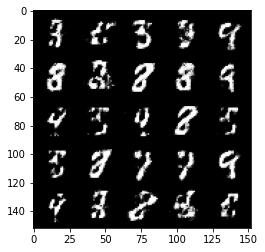

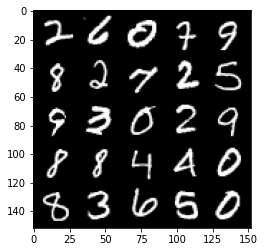

Step 68000: Generator loss: 1.6547243657112112, discriminator loss: 0.3966663561463352


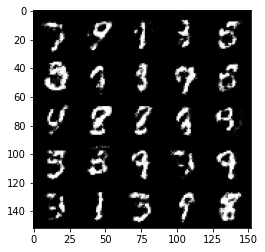

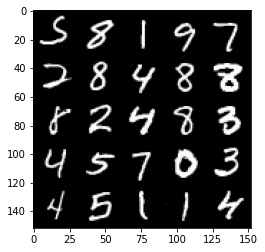

Step 68500: Generator loss: 1.562982711791993, discriminator loss: 0.4199483278989795


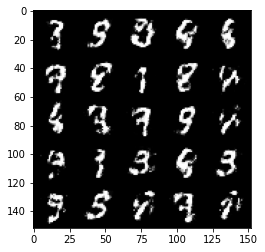

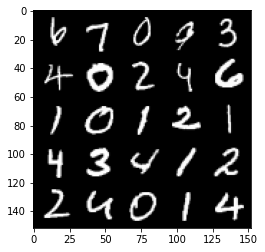

Step 69000: Generator loss: 1.6163499486446378, discriminator loss: 0.3971150386929511


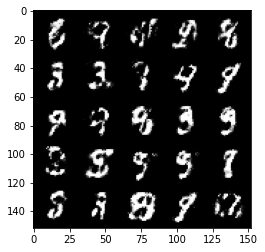

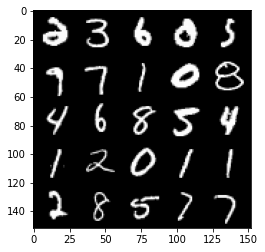

Step 69500: Generator loss: 1.5319589323997485, discriminator loss: 0.41529410165548364


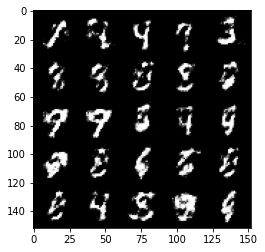

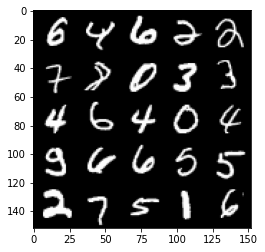

Step 70000: Generator loss: 1.562393428325651, discriminator loss: 0.4075590273141865


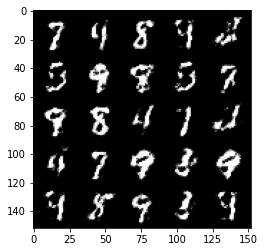

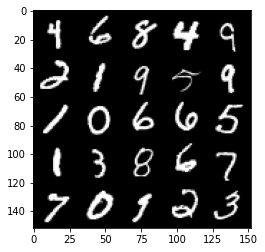

Step 70500: Generator loss: 1.5218595364093777, discriminator loss: 0.4083667280077929


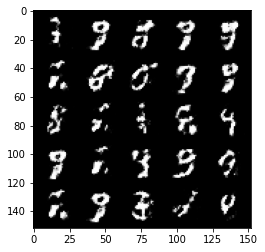

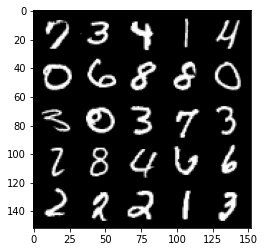

Step 71000: Generator loss: 1.630541533231735, discriminator loss: 0.38630936217308065


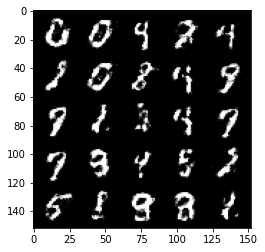

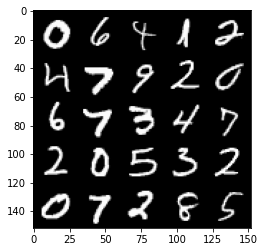

Step 71500: Generator loss: 1.4815350537300112, discriminator loss: 0.42322875392437


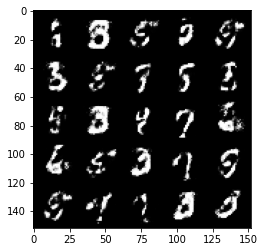

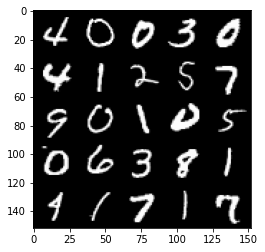

Step 72000: Generator loss: 1.5920033364295951, discriminator loss: 0.39722858339548095


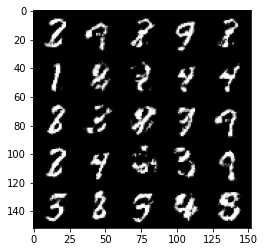

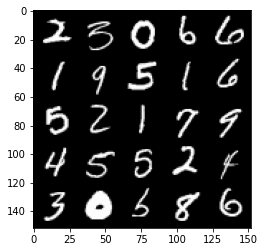

Step 72500: Generator loss: 1.6019523379802703, discriminator loss: 0.4058087422251705


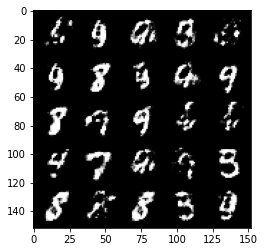

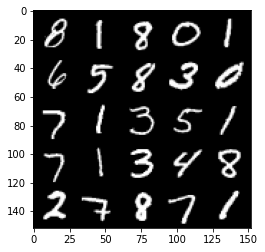

Step 73000: Generator loss: 1.5136037013530743, discriminator loss: 0.4183252099752426


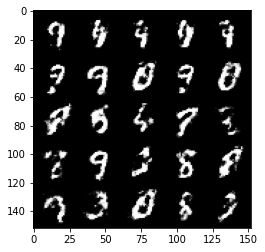

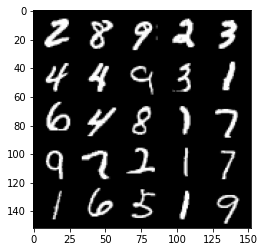

Step 73500: Generator loss: 1.6040660474300392, discriminator loss: 0.39431611591577526


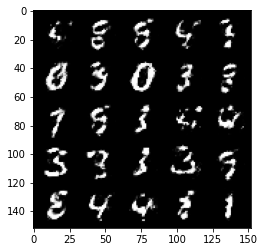

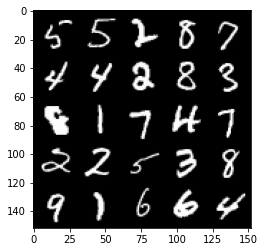

Step 74000: Generator loss: 1.5487643475532529, discriminator loss: 0.41284858399629604


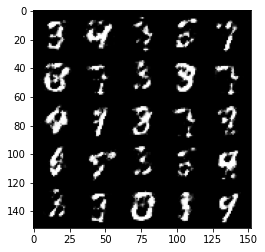

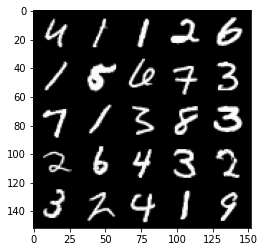

Step 74500: Generator loss: 1.4672402734756462, discriminator loss: 0.4294255608320238


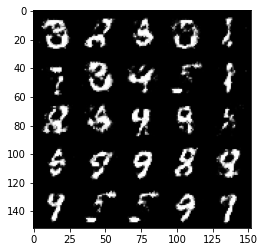

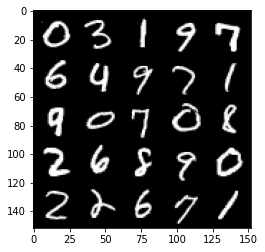

Step 75000: Generator loss: 1.5753384895324716, discriminator loss: 0.39464518171548835


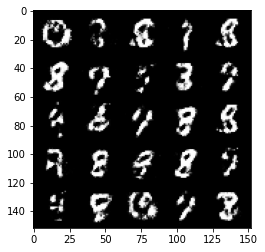

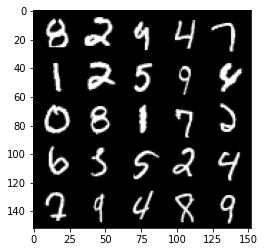

Step 75500: Generator loss: 1.4932148520946495, discriminator loss: 0.4193406363129614


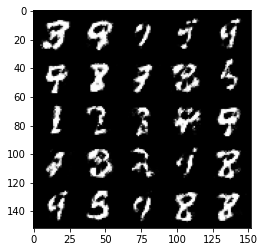

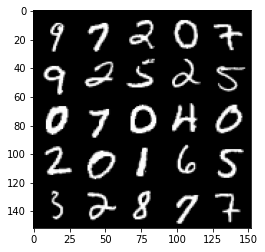

Step 76000: Generator loss: 1.4859753100872046, discriminator loss: 0.4434276709556579


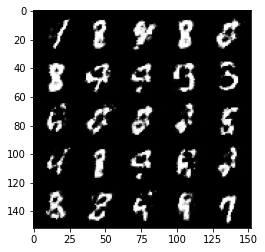

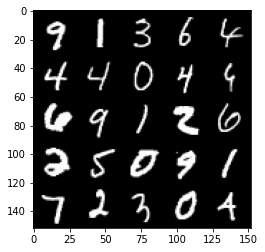

Step 76500: Generator loss: 1.4094146895408635, discriminator loss: 0.4433271098136905


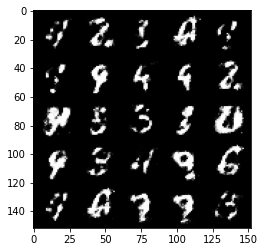

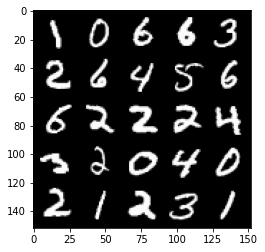

Step 77000: Generator loss: 1.4407926011085506, discriminator loss: 0.41774052786827126


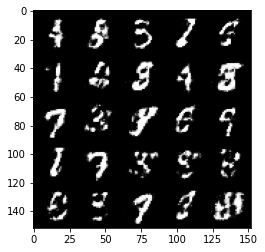

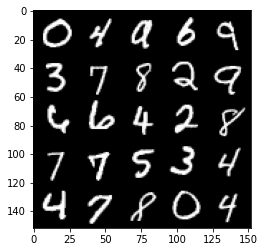

Step 77500: Generator loss: 1.4648681085109705, discriminator loss: 0.4247007221579549


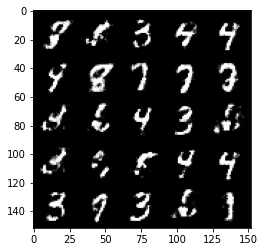

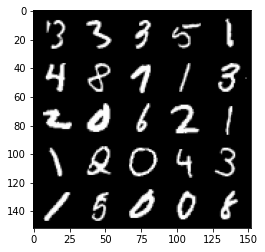

Step 78000: Generator loss: 1.4978122503757483, discriminator loss: 0.4354194381237029


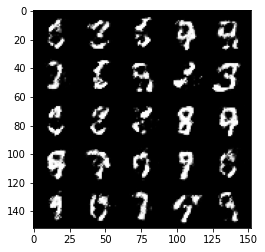

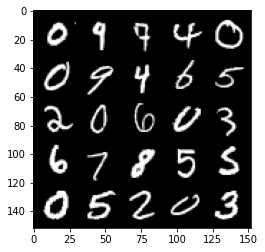

Step 78500: Generator loss: 1.4209420902729035, discriminator loss: 0.4486830175518987


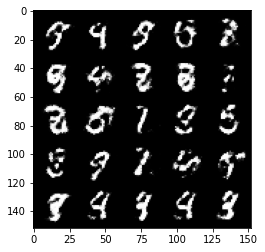

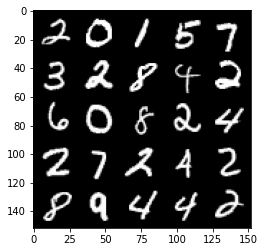

Step 79000: Generator loss: 1.467289717912673, discriminator loss: 0.43134994989633496


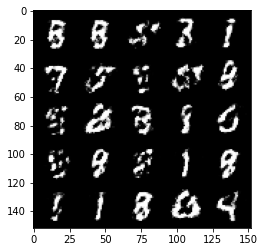

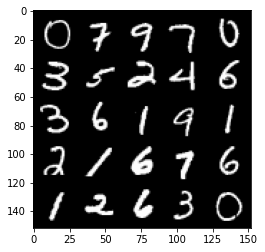

Step 79500: Generator loss: 1.4112241306304933, discriminator loss: 0.4525705876350403


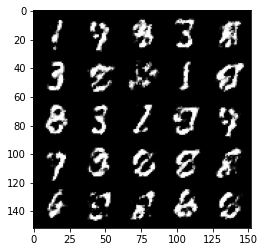

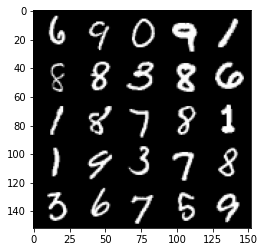

Step 80000: Generator loss: 1.400286077022553, discriminator loss: 0.45899119484424594


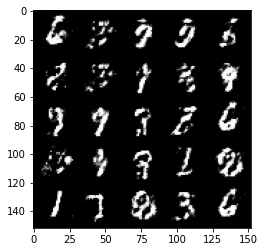

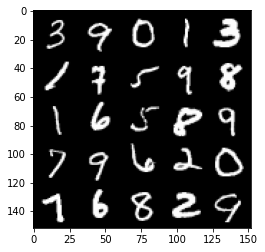

Step 80500: Generator loss: 1.3498284325599668, discriminator loss: 0.4649309098124508


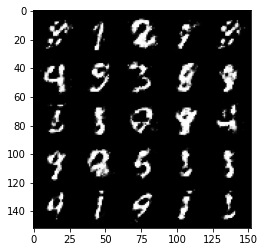

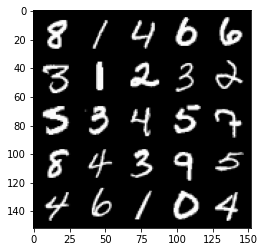

Step 81000: Generator loss: 1.4357581231594085, discriminator loss: 0.43209923577308595


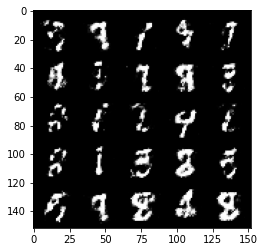

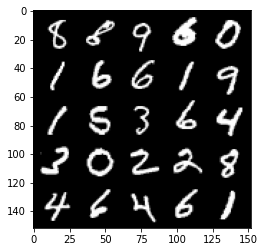

Step 81500: Generator loss: 1.4904574725627893, discriminator loss: 0.4149921089410782


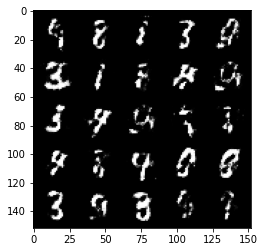

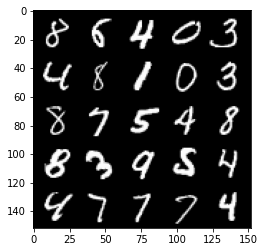

Step 82000: Generator loss: 1.4579471194744114, discriminator loss: 0.4333950408101082


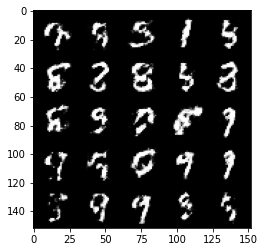

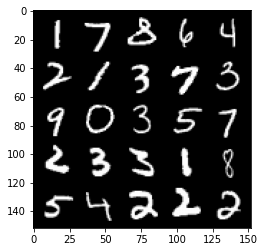

Step 82500: Generator loss: 1.4559061341285713, discriminator loss: 0.43500996768474565


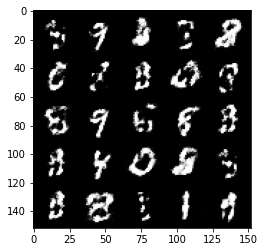

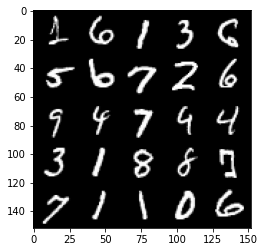

Step 83000: Generator loss: 1.3912082545757287, discriminator loss: 0.44691344916820563


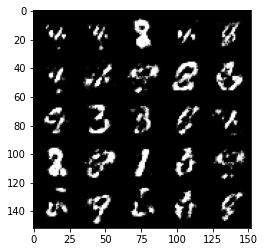

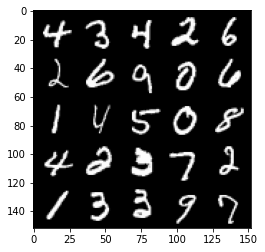

Step 83500: Generator loss: 1.2839346911907192, discriminator loss: 0.4814706245660782


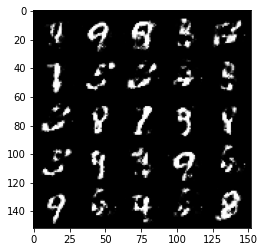

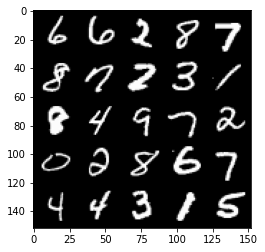

Step 84000: Generator loss: 1.292214902877808, discriminator loss: 0.4791527346372606


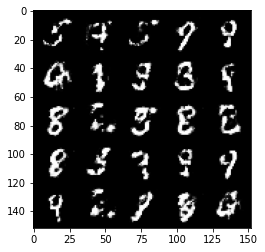

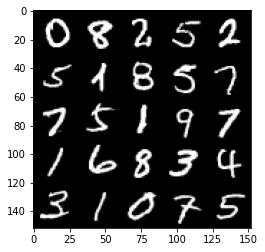

Step 84500: Generator loss: 1.3313452339172371, discriminator loss: 0.46191175144910823


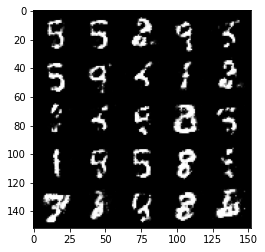

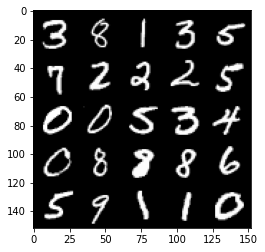

Step 85000: Generator loss: 1.3628821341991422, discriminator loss: 0.4428790185451504


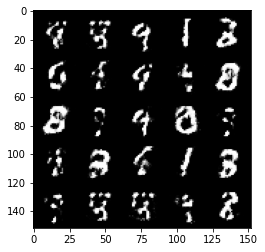

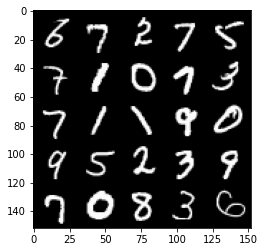

Step 85500: Generator loss: 1.3252077596187595, discriminator loss: 0.45862261021137246


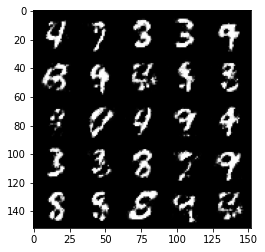

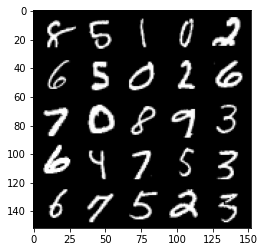

Step 86000: Generator loss: 1.354201116323471, discriminator loss: 0.4617440340518953


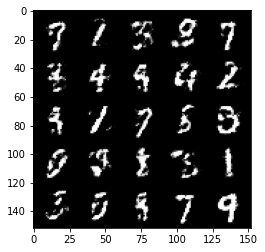

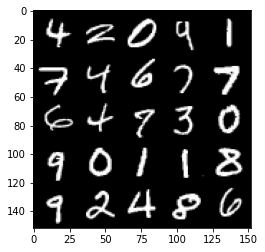

Step 86500: Generator loss: 1.2904865260124212, discriminator loss: 0.48522434031963324


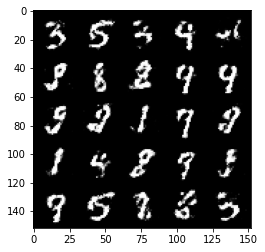

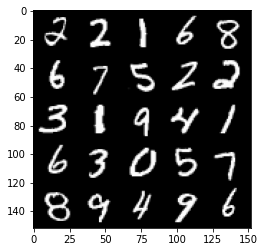

Step 87000: Generator loss: 1.3139913699626942, discriminator loss: 0.46822780126333224


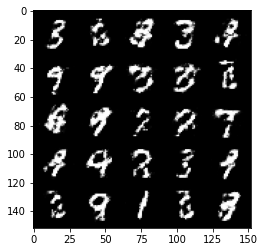

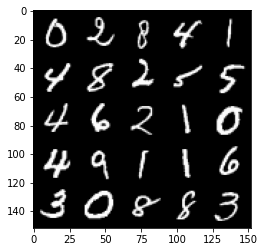

Step 87500: Generator loss: 1.3226578752994524, discriminator loss: 0.47034775245189675


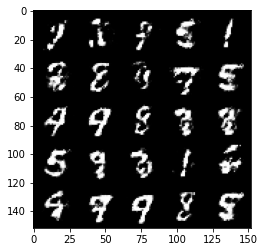

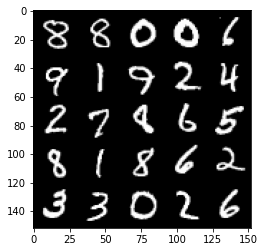

Step 88000: Generator loss: 1.326613680124284, discriminator loss: 0.4640579107403758


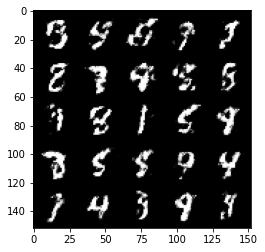

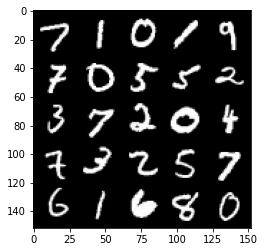

Step 88500: Generator loss: 1.3916628684997563, discriminator loss: 0.4442402764558797


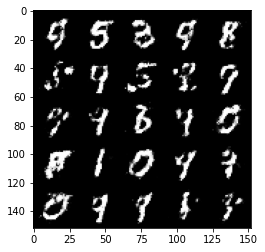

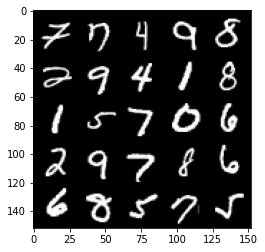

Step 89000: Generator loss: 1.3928703842163088, discriminator loss: 0.4436445108056071


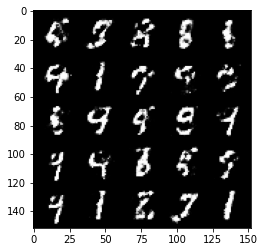

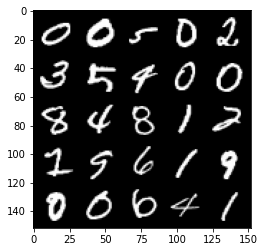

Step 89500: Generator loss: 1.3315692648887638, discriminator loss: 0.46553551018238065


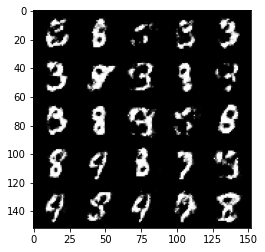

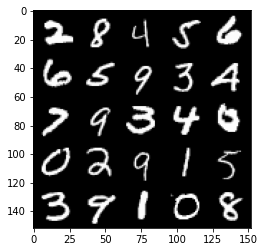

Step 90000: Generator loss: 1.3250235018730163, discriminator loss: 0.4648194392919538


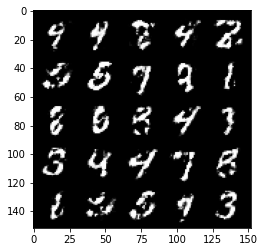

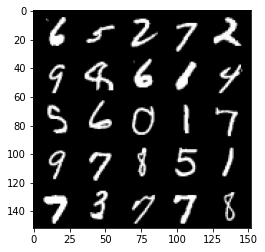

Step 90500: Generator loss: 1.3249664053916919, discriminator loss: 0.46540219038724867


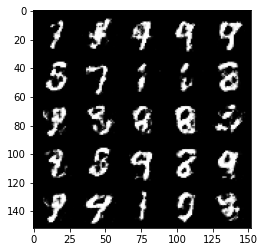

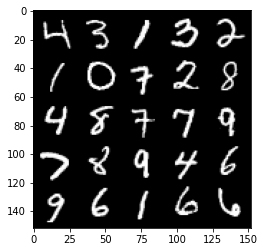

Step 91000: Generator loss: 1.3187858774662002, discriminator loss: 0.46530496954917894


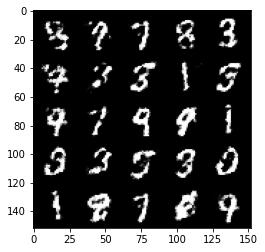

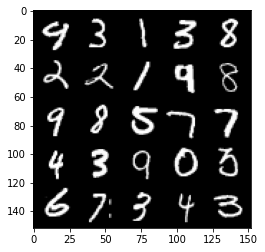

Step 91500: Generator loss: 1.3012017047405242, discriminator loss: 0.46521511709690067


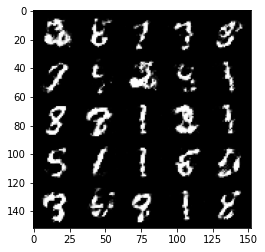

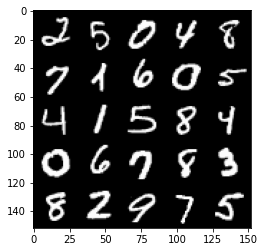

Step 92000: Generator loss: 1.2417872989177703, discriminator loss: 0.48384893411397956


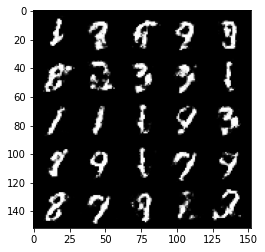

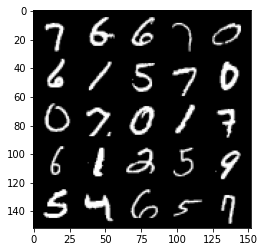

Step 92500: Generator loss: 1.2107872819900516, discriminator loss: 0.5000390005707739


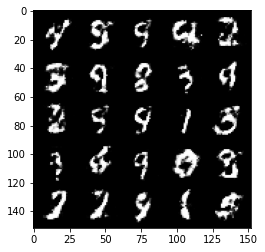

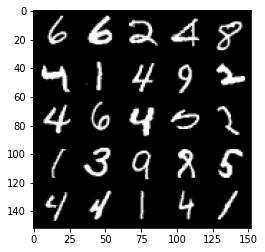

Step 93000: Generator loss: 1.2974901614189165, discriminator loss: 0.4701159948110578


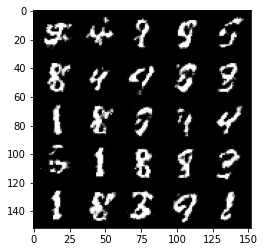

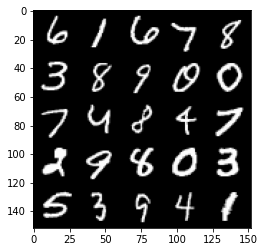

Step 93500: Generator loss: 1.4056938128471381, discriminator loss: 0.44567235511541364


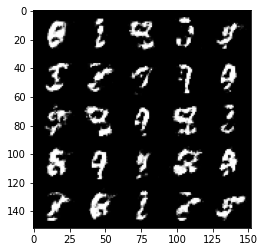

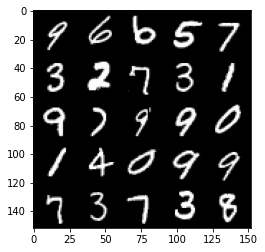

In [ ]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
